##**Importing Necessray Libraries**

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!pip install pycodestyle

In [ ]:
!pip install pycodestyle_magic

In [ ]:
!pip install flake8

In [6]:
%load_ext pycodestyle_magic

In [10]:
%%pycodestyle
a = 1

INFO:pycodestyle:3:1: W391 blank line at end of file


In [15]:
%%pycodestyle
def square_of_number(num1, num2, num3, num4):
    return num1**2, num2**2, num3**2, num4**2

INFO:pycodestyle:4:1: W391 blank line at end of file


In [18]:
%%pycodestyle
import os
import copy
import random
import json
import yaml
import glob
import cv2
import numpy as np
import time
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import requests
from zipfile import ZipFile
import argparse
from PIL import Image
import PIL.Image
import shutil
from IPython.display import Image
from sklearn.model_selection import train_test_split
import torch
import torch.utils.data
from torch import nn
import torchvision
from ultralytics import YOLO
from torchvision import transforms as T
from pycocotools import mask as coco_mask
from pycocotools.coco import COCO

INFO:pycodestyle:29:1: W391 blank line at end of file


##**Dataset Creation**

In [20]:
import requests
def download_file(url, destination):
    response = requests.get(url, stream=True)
    # Raise an error if the status code is not 200
    response.raise_for_status()
    # Open a file in binary write mode
    with open(destination, 'wb') as f:
        # Write chunks of data to the file
        for chunk in response.iter_content(chunk_size=8192):
            f.write(chunk)
url = "https://s3.us-west-2.amazonaws.com/testing.resources/datasets/deepfashion/deep_fashion.tar"
destination = "deep_fashion.tar"
download_file(url, destination)

INFO:pycodestyle:3:1: E302 expected 2 blank lines, found 0
INFO:pycodestyle:12:1: E305 expected 2 blank lines after class or function definition, found 0
INFO:pycodestyle:12:80: E501 line too long (98 > 79 characters)
INFO:pycodestyle:15:1: W391 blank line at end of file


In [3]:
import tarfile
def extract_tar(file_path, destination):
    with tarfile.open(file_path, 'r') as tar:
        tar.extractall(destination)
file_path = "deep_fashion.tar"
destination = "deep_fashion_extracted"
extract_tar(file_path, destination)


In [4]:
import json
json_file_path = "/content/deep_fashion_extracted/deep_fashion/annotations/instances_train2024.json"
with open(json_file_path, 'r') as f:
    data = json.load(f)

In [5]:
print(list(data.keys())[:5])

['info', 'categories', 'annotations', 'images']


In [6]:
data['info']

{'year': '2024',
 'version': '1',
 'description': 'Sample dataset created from MSCOCO',
 'contributors': 'Matrice.ai',
 'url': '',
 'date_created': '2024-03-13 08:06:01'}

In [7]:
data['categories']

[{'id': 8, 'name': 'trousers', 'supercategory': 'deep fashion'},
 {'id': 1, 'name': 'short sleeve top', 'supercategory': 'deep fashion'},
 {'id': 11, 'name': 'long sleeve dress', 'supercategory': 'deep fashion'},
 {'id': 2, 'name': 'long sleeve top', 'supercategory': 'deep fashion'},
 {'id': 9, 'name': 'skirt', 'supercategory': 'deep fashion'},
 {'id': 7, 'name': 'shorts', 'supercategory': 'deep fashion'},
 {'id': 4, 'name': 'long sleeve outwear', 'supercategory': 'deep fashion'},
 {'id': 12, 'name': 'vest dress', 'supercategory': 'deep fashion'},
 {'id': 10, 'name': 'short sleeve dress', 'supercategory': 'deep fashion'},
 {'id': 5, 'name': 'vest', 'supercategory': 'deep fashion'},
 {'id': 13, 'name': 'sling dress', 'supercategory': 'deep fashion'},
 {'id': 3, 'name': 'short sleeve outwear', 'supercategory': 'deep fashion'},
 {'id': 6, 'name': 'sling', 'supercategory': 'deep fashion'}]

In [8]:
data['annotations'][0]

{'segmentation': [[460,
   438,
   374,
   484,
   251,
   520,
   269,
   586,
   298,
   622,
   410,
   623,
   410,
   567,
   413,
   591,
   420,
   623,
   465,
   622,
   456,
   561,
   466,
   504,
   460,
   438],
  [374, 484, 251, 520, 269, 586, 298, 622, 410, 623, 410, 567, 374, 484],
  [460,
   438,
   374,
   484,
   410,
   567,
   413,
   591,
   420,
   623,
   465,
   622,
   456,
   561,
   466,
   504,
   460,
   438]],
 'landmarks': [251,
  520,
  1,
  374,
  484,
  1,
  460,
  438,
  1,
  269,
  586,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  410,
  567,
  1,
  413,
  591,
  2,
  0,
  0,
  0,
  0,
  0,
  0,
  456,
  561,
  2,
  0,
  0,
  0],
 'category_id': 8,
 'is_crowd': [0],
 'bbox': [249, 423, 217, 200],
 'id': 1,
 'image_id': '000001'}

In [ ]:
import json

# Define the path to the annotations JSON file
annotations_file_path = "/content/deep_fashion_extracted/deep_fashion/annotations/instances_train2024.json"

# Read the annotations JSON file
with open(annotations_file_path, 'r') as f:
    annotations_data = json.load(f)

# Count the number of instances for each class across all images
class_counts = {}
for annotation in annotations_data['annotations']:
    category_id = annotation['category_id']
    if category_id not in class_counts:
        class_counts[category_id] = 0
    class_counts[category_id] += 1

# Filter out classes with more than 50 instances
included_classes = [category_id for category_id, count in class_counts.items() if count > 50]

# Filter images based on included classes
included_images = []
for annotation in annotations_data['annotations']:
    category_id = annotation['category_id']
    if category_id in included_classes:
        included_images.append(annotation['image_id'])

# Print the list of included images
print("Included images:", included_images)


In [10]:
len(included_images)

312186

In [11]:
included_images[0]

'000001'

In [12]:
import os
import shutil

# Define the path to the train split directory
train_dir = "/content/deep_fashion_extracted/deep_fashion/images/train"

# Create a directory to store the selected images
selected_images_dir = "/content/selected_images/train"
os.makedirs(selected_images_dir, exist_ok=True)

# Function to copy the first 500 images from a directory

def copy_first_images(directory, num_images, destination):
    count=0
    images = sorted(os.listdir(directory))
    for img in images:
        if count!=num_images:
          without_extension = img.split('.')[0]
          if without_extension in included_images:
              shutil.copy(os.path.join(directory, img), os.path.join(destination, img))
              count+=1

# Copy the first 500 images from the train directory
copy_first_images(train_dir, 500, selected_images_dir)


In [13]:
import os
import shutil
import random

# Define the path to the selected images directory
selected_images_dir = "/content/selected_images/train"
train_dir = "/content/selected_images/train"
val_dir = "/content/selected_images/val"
test_dir = "/content/selected_images/test"

# Create directories for validation and test sets
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Randomly shuffle the list of selected images
selected_images = os.listdir(selected_images_dir)
random.shuffle(selected_images)

# Calculate the number of images for each split
num_train = 350
num_val = 100
num_test = 50

# Split the selected images into train, validation, and test sets
train_images = selected_images[:num_train]
val_images = selected_images[num_train:num_train+num_val]
test_images = selected_images[num_train+num_val:]

# Function to move images to the respective directories
def move_images(images, source_dir, destination_dir):
    for img in images:
        shutil.move(os.path.join(source_dir, img), os.path.join(destination_dir, img))

# Move images to the train, validation, and test directories
move_images(train_images, train_dir, train_dir)
move_images(val_images, train_dir, val_dir)
move_images(test_images, train_dir, test_dir)


In [14]:
!pwd

/content


In [15]:
%cd '/content/gdrive/MyDrive/'

/content/gdrive/MyDrive


##**YOLO_V9**

In [16]:
!git clone https://github.com/WongKinYiu/yolov9.git

Cloning into 'yolov9'...
remote: Enumerating objects: 668, done.
remote: Counting objects: 100% (290/290), done.
remote: Compressing objects: 100% (91/91), done.
remote: Total 668 (delta 222), reused 199 (delta 199), pack-reused 378
Receiving objects: 100% (668/668), 3.22 MiB | 6.76 MiB/s, done.
Resolving deltas: 100% (269/269), done.


In [17]:
%cd yolov9

/content/gdrive/MyDrive/yolov9


In [18]:
!pip install -r requirements.txt

In [20]:
!pip install ultralytics
from ultralytics import YOLO

In [ ]:
data['categories']

[{'id': 8, 'name': 'trousers', 'supercategory': 'deep fashion'},
 {'id': 1, 'name': 'short sleeve top', 'supercategory': 'deep fashion'},
 {'id': 11, 'name': 'long sleeve dress', 'supercategory': 'deep fashion'},
 {'id': 2, 'name': 'long sleeve top', 'supercategory': 'deep fashion'},
 {'id': 9, 'name': 'skirt', 'supercategory': 'deep fashion'},
 {'id': 7, 'name': 'shorts', 'supercategory': 'deep fashion'},
 {'id': 4, 'name': 'long sleeve outwear', 'supercategory': 'deep fashion'},
 {'id': 12, 'name': 'vest dress', 'supercategory': 'deep fashion'},
 {'id': 10, 'name': 'short sleeve dress', 'supercategory': 'deep fashion'},
 {'id': 5, 'name': 'vest', 'supercategory': 'deep fashion'},
 {'id': 13, 'name': 'sling dress', 'supercategory': 'deep fashion'},
 {'id': 3, 'name': 'short sleeve outwear', 'supercategory': 'deep fashion'},
 {'id': 6, 'name': 'sling', 'supercategory': 'deep fashion'}]

In [ ]:
data['images'][0]

{'height': 624,
 'width': 468,
 'license': 1,
 'file_name': '000001.jpg',
 'date_captured': '2024-03-13 23:11:37',
 'id': '000001'}

In [ ]:
data['annotations'][0]

{'segmentation': [[460,
   438,
   374,
   484,
   251,
   520,
   269,
   586,
   298,
   622,
   410,
   623,
   410,
   567,
   413,
   591,
   420,
   623,
   465,
   622,
   456,
   561,
   466,
   504,
   460,
   438],
  [374, 484, 251, 520, 269, 586, 298, 622, 410, 623, 410, 567, 374, 484],
  [460,
   438,
   374,
   484,
   410,
   567,
   413,
   591,
   420,
   623,
   465,
   622,
   456,
   561,
   466,
   504,
   460,
   438]],
 'landmarks': [251,
  520,
  1,
  374,
  484,
  1,
  460,
  438,
  1,
  269,
  586,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  410,
  567,
  1,
  413,
  591,
  2,
  0,
  0,
  0,
  0,
  0,
  0,
  456,
  561,
  2,
  0,
  0,
  0],
 'category_id': 8,
 'is_crowd': [0],
 'bbox': [249, 423, 217, 200],
 'id': 1,
 'image_id': '000001'}

In [22]:
def create_yaml(output_yaml_path, train_images_dir, val_images_dir,test_images_dir, nc=13):
    names = ['trousers','long sleeve top','short sleeve outwear','long sleeve outwear','vest','sling','shorts','trousers','skirt','short sleeve dress','long sleeve dress','vest dress','sling dress']

    # Create a dictionary with the required content
    yaml_data = {
        'names': names,
        'nc': 13,  # Number of classes
        'train': train_images_dir,
        'val': val_images_dir,
        'test': test_images_dir

    }

    # Write the dictionary to a YAML file
    with open(output_yaml_path, 'w') as file:
        yaml.dump(yaml_data, file, default_flow_style=False)

In [23]:

data_dir = 'Dataset'
output_dir = 'yolov9_dataset'

# Define the paths for the images and labels for training and validation
train_images_dir = os.path.join(output_dir, 'train', 'images')
val_images_dir = os.path.join(output_dir, 'val', 'images')
train_labels_dir = os.path.join(output_dir, 'train', 'labels')
val_labels_dir = os.path.join(output_dir, 'val', 'labels')
test_images_dir = os.path.join(output_dir, 'test', 'images')
test_labels_dir = os.path.join(output_dir, 'test', 'labels')

# Create the output directories if they do not exist
os.makedirs(train_images_dir, exist_ok=True)
os.makedirs(val_images_dir, exist_ok=True)
os.makedirs(train_labels_dir, exist_ok=True)
os.makedirs(val_labels_dir, exist_ok=True)
os.makedirs(test_images_dir, exist_ok=True)
os.makedirs(test_labels_dir, exist_ok=True)

# Process and save the data in YOLO format for training and validation

In [24]:
import os
def get_jpg_file_names(directory):
    jpg_file_names = []
    for root, _, files in os.walk(directory):
        for file in files:
            if file.endswith('.jpg'):
                jpg_file_names.append(file)
    return jpg_file_names

In [26]:
image_directory = "/content/gdrive/MyDrive/yolov9/yolov9_dataset/train/images"
train_path = get_jpg_file_names(image_directory)

In [27]:
image_directory = "/content/gdrive/MyDrive/yolov9/yolov9_dataset/test/images"
test_path = get_jpg_file_names(image_directory)

In [31]:
image_directory = "/content/gdrive/MyDrive/yolov9/yolov9_dataset/val/images"
val_path = get_jpg_file_names(image_directory)

In [36]:
def process_data(output_labels_dir):
  for img_info in test_path:
        img_id = img_info.split('.')[0]
        img_ann = [ann for ann in data["annotations"] if ann["image_id"] == img_id]
        image = [ img for img in data["images"] if img["file_name"] == img_info]
        print(image)
        img_w, img_h=image[0]["width"],image[0]["height"]
        if img_ann:
            with open(os.path.join(output_labels_dir, os.path.splitext(img_info)[0] + '.txt'), 'w') as file_object:
                for ann in img_ann:
                    current_category = ann['category_id'] - 1
                    polygon = ann['segmentation'][0]
                    normalized_polygon = [format(coord / img_w if i % 2 == 0 else coord / img_h, '.6f') for i, coord in enumerate(polygon)]
                    file_object.write(f"{current_category} " + " ".join(normalized_polygon) + "\n")
                    print("done")

In [ ]:
process_data(train_labels_dir)

In [ ]:
process_data(val_labels_dir)


In [ ]:
process_data(test_labels_dir)

In [38]:

# Assume create_yaml function is defined elsewhere and set appropriate paths for the YAML file
output_yaml_path = os.path.join(output_dir, 'data.yaml')
train_path = os.path.join('train', 'images')
val_path = os.path.join('val', 'images')
test_path = os.path.join('test', 'images')

##**Model Creation**

In [41]:
create_yaml(output_yaml_path, train_path, val_path,test_path)

In [42]:
model = YOLO("yolov9c-seg.yaml")#build a model from YAML
model = YOLO("yolov9c-seg.pt")

100%|██████████| 53.9M/53.9M [00:00<00:00, 76.2MB/s]

WARNING ⚠️ yolov9c-seg.pt appears to require 'dill', which is not in ultralytics requirements.
AutoInstall will run now for 'dill' but this feature will be removed in the future.
Recommend fixes are to train a new model using the latest 'ultralytics' package or to run a command with an official YOLOv8 model, i.e. 'yolo predict model=yolov8n.pt'
requirements: Ultralytics requirement ['dill'] not found, attempting AutoUpdate...


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 4.9 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 7.3s, installed 1 package: ['dill']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect



In [43]:
with open("yolov9_dataset/data.yaml",'r') as stream:
     num_classes = str(yaml.safe_load(stream)['nc'])

In [46]:
project = "yolov9_dataset/results"
#Define subdirectory for this specific training
name = "100_epochs-"

In [47]:
ABS_PATH = os.getcwd()

##**Model Training**

In [49]:
results = model.train(
    data = os.path.join(ABS_PATH, "yolov9_dataset/data.yaml"),
    project = project,
    name = name,
    epochs = 100,
    patience = 0 , #setting patience=0 to disable early stopping,
    batch = 4,
)

Ultralytics YOLOv8.2.8 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov9c-seg.pt, data=/content/gdrive/MyDrive/yolov9/yolov9_dataset/data.yaml, epochs=100, time=None, patience=0, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=yolov9_dataset/results, name=100_epochs-2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, 

100%|██████████| 6.23M/6.23M [00:00<00:00, 93.7MB/s]


AMP: checks passed ✅


train: Scanning /content/gdrive/MyDrive/yolov9/yolov9_dataset/train/labels... 350 images, 0 backgrounds, 5 corrupt: 100%|██████████| 350/350 [00:03<00:00, 90.69it/s] 

train: WARNING ⚠️ /content/gdrive/MyDrive/yolov9/yolov9_dataset/train/images/000129.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0011]
train: WARNING ⚠️ /content/gdrive/MyDrive/yolov9/yolov9_dataset/train/images/000225.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0004]
train: WARNING ⚠️ /content/gdrive/MyDrive/yolov9/yolov9_dataset/train/images/000237.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0021]
train: WARNING ⚠️ /content/gdrive/MyDrive/yolov9/yolov9_dataset/train/images/000238.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0011]
train: WARNING ⚠️ /content/gdrive/MyDrive/yolov9/yolov9_dataset/train/images/000305.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0005]


train: New cache created: /content/gdrive/MyDrive/yolov9/yolov9_dataset/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/gdrive/MyDrive/yolov9/yolov9_dataset/val/labels... 100 images, 0 backgrounds, 1 corrupt: 100%|██████████| 100/100 [00:01<00:00, 77.87it/s]

val: WARNING ⚠️ /content/gdrive/MyDrive/yolov9/yolov9_dataset/val/images/000250.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0007]


val: New cache created: /content/gdrive/MyDrive/yolov9/yolov9_dataset/val/labels.cache
Plotting labels to yolov9_dataset/results/100_epochs-2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000588, momentum=0.9) with parameter groups 163 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to yolov9_dataset/results/100_epochs-2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/100      4.13G      1.156      3.116      3.069      1.542          6        640: 100%|██████████| 87/87 [00:39<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.98it/s]


                   all         99        162       0.34      0.373      0.205      0.118      0.496       0.25      0.196       0.11

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/100      3.91G       1.21      2.938       2.57       1.52          6        640: 100%|██████████| 87/87 [00:39<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.72it/s]


                   all         99        162      0.473      0.152      0.128      0.078      0.473      0.152      0.125     0.0616

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/100      3.93G      1.269      2.964      2.579      1.598          3        640: 100%|██████████| 87/87 [00:29<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  3.09it/s]

                   all         99        162      0.214      0.259      0.167     0.0903      0.213      0.243      0.131     0.0712



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/100      3.91G      1.378       2.99      2.542      1.641          8        640: 100%|██████████| 87/87 [00:31<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.56it/s]


                   all         99        162      0.319      0.266      0.154     0.0785      0.316      0.296      0.169     0.0755

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/100      3.88G      1.305      3.061      2.507      1.626          4        640: 100%|██████████| 87/87 [00:32<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.69it/s]


                   all         99        162      0.406      0.277      0.214      0.109      0.394      0.248      0.198     0.0975

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/100      3.91G      1.294      2.961      2.361      1.623          4        640: 100%|██████████| 87/87 [00:31<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  3.20it/s]

                   all         99        162      0.397      0.288      0.196     0.0983      0.389       0.19       0.16     0.0841



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/100      3.93G      1.325      2.954      2.209       1.62          5        640: 100%|██████████| 87/87 [00:31<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.91it/s]

                   all         99        162      0.437      0.323      0.269      0.167      0.424      0.302      0.251      0.139



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/100      3.87G      1.337      2.968      2.268      1.638          2        640: 100%|██████████| 87/87 [00:30<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.87it/s]


                   all         99        162      0.476      0.323      0.268      0.153       0.47      0.313      0.239      0.132

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/100      3.93G      1.214      2.741      2.104      1.534          4        640: 100%|██████████| 87/87 [00:31<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.53it/s]

                   all         99        162      0.572      0.409       0.38      0.243      0.552      0.382      0.352      0.199



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/100      3.94G       1.16      2.778      1.985      1.494          7        640: 100%|██████████| 87/87 [00:32<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.86it/s]


                   all         99        162      0.434      0.417      0.408      0.256      0.417      0.387      0.386      0.226

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/100       3.9G      1.142      2.621      1.905      1.478          6        640: 100%|██████████| 87/87 [00:30<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.53it/s]


                   all         99        162      0.538       0.41      0.391      0.259      0.522      0.401      0.371      0.224

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/100      3.89G      1.186       2.71      1.994      1.499          2        640: 100%|██████████| 87/87 [00:30<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.16it/s]

                   all         99        162      0.559       0.47      0.454      0.269      0.554      0.399      0.405      0.236



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/100      3.89G      1.111      2.565      1.833      1.452          5        640: 100%|██████████| 87/87 [00:31<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.64it/s]


                   all         99        162      0.371      0.458       0.37      0.233      0.602      0.278      0.334      0.182

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/100      3.91G      1.112      2.579       1.87      1.467          7        640: 100%|██████████| 87/87 [00:37<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.87it/s]

                   all         99        162      0.624        0.3      0.411      0.273      0.624        0.3      0.375      0.232



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/100      3.91G       1.05       2.47       1.73      1.428          7        640: 100%|██████████| 87/87 [00:34<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  3.20it/s]

                   all         99        162      0.591      0.467      0.488      0.318      0.583      0.455      0.449      0.267



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/100      3.89G      1.105      2.621      1.769      1.463          7        640: 100%|██████████| 87/87 [00:31<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.51it/s]


                   all         99        162      0.593      0.477      0.542      0.368      0.593      0.477      0.532       0.32

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/100      3.91G      1.037      2.452      1.649      1.419          2        640: 100%|██████████| 87/87 [00:31<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.54it/s]


                   all         99        162      0.666      0.457      0.509      0.346      0.713      0.407      0.481       0.27

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/100      3.91G      1.039      2.431      1.619      1.422          2        640: 100%|██████████| 87/87 [00:30<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.87it/s]


                   all         99        162      0.609      0.479      0.546       0.39      0.624      0.468      0.546      0.346

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/100       3.9G      1.058      2.391      1.706      1.446          1        640: 100%|██████████| 87/87 [00:31<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.57it/s]

                   all         99        162      0.644      0.482      0.551      0.374      0.636      0.485      0.527      0.314



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/100      3.91G     0.9867      2.268      1.513      1.369          5        640: 100%|██████████| 87/87 [00:31<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.63it/s]

                   all         99        162      0.636      0.513      0.578      0.383      0.536      0.482      0.539       0.34



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/100      3.97G     0.9997      2.357      1.525      1.378          2        640: 100%|██████████| 87/87 [00:30<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.75it/s]

                   all         99        162      0.591      0.528      0.587      0.401      0.589      0.517      0.583      0.348



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/100      3.92G     0.9613      2.355       1.49      1.355          3        640: 100%|██████████| 87/87 [00:30<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.86it/s]

                   all         99        162      0.748      0.467      0.597      0.407      0.742      0.452      0.588      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/100      3.92G     0.9396      2.253      1.466      1.332          5        640: 100%|██████████| 87/87 [00:31<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.47it/s]

                   all         99        162      0.633      0.539      0.566      0.409      0.611       0.52      0.545      0.333



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/100      3.83G     0.9124      2.188      1.375      1.302          5        640: 100%|██████████| 87/87 [00:30<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.55it/s]

                   all         99        162      0.651      0.533      0.649      0.446      0.653      0.565      0.633      0.369



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/100      3.95G     0.8831      2.184      1.358      1.306          6        640: 100%|██████████| 87/87 [00:32<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.46it/s]


                   all         99        162      0.681      0.609      0.673      0.484      0.712      0.537      0.626      0.378

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/100      3.89G     0.9482      2.242        1.4      1.339          5        640: 100%|██████████| 87/87 [00:30<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.43it/s]

                   all         99        162      0.744      0.434      0.683      0.497      0.741      0.432      0.665      0.397



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/100      3.91G     0.8942      2.182      1.369      1.308          3        640: 100%|██████████| 87/87 [00:30<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.47it/s]


                   all         99        162      0.632      0.565      0.685      0.484      0.618      0.556      0.664        0.4

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/100      3.92G     0.9094      2.111      1.364      1.318          3        640: 100%|██████████| 87/87 [00:30<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.79it/s]


                   all         99        162      0.576      0.615      0.634      0.439      0.632       0.51      0.623      0.364

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/100      3.94G     0.8923      2.127       1.35      1.304          2        640: 100%|██████████| 87/87 [00:30<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.40it/s]

                   all         99        162       0.66      0.567       0.64      0.457      0.658      0.565       0.63      0.361



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/100      3.93G      0.839      1.991      1.252      1.261          3        640: 100%|██████████| 87/87 [00:31<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.89it/s]

                   all         99        162      0.771       0.56      0.672      0.483      0.762      0.559      0.643      0.392



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/100      3.92G     0.8549      2.057      1.321       1.27          5        640: 100%|██████████| 87/87 [00:30<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.86it/s]


                   all         99        162      0.718      0.544      0.704      0.491      0.712      0.535      0.674      0.419

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/100      3.89G     0.8575      1.995      1.252      1.261          5        640: 100%|██████████| 87/87 [00:31<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.79it/s]

                   all         99        162      0.708      0.497      0.657       0.48      0.691      0.488       0.64      0.398



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/100      3.92G     0.8471      2.081      1.205      1.277          4        640: 100%|██████████| 87/87 [00:34<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.05it/s]

                   all         99        162      0.735      0.516      0.685       0.51      0.731      0.512      0.676      0.431



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/100      3.94G     0.8151      1.946      1.214      1.228          4        640: 100%|██████████| 87/87 [00:31<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.86it/s]

                   all         99        162      0.731      0.563      0.703      0.523      0.716      0.549       0.68      0.417



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/100      3.89G     0.8018       2.06       1.19      1.236          2        640: 100%|██████████| 87/87 [00:32<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.74it/s]

                   all         99        162      0.811      0.517      0.735       0.53      0.777      0.543      0.721      0.443



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/100      3.95G     0.8177      2.019      1.187      1.253          1        640: 100%|██████████| 87/87 [00:32<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.75it/s]


                   all         99        162      0.699      0.631      0.756      0.552      0.828      0.517      0.746      0.488

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/100      3.92G     0.7936      1.929      1.182      1.224          5        640: 100%|██████████| 87/87 [00:31<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.63it/s]

                   all         99        162       0.73      0.544       0.69      0.517      0.737      0.531      0.686      0.452



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/100      3.94G     0.7942      1.884      1.086      1.217          4        640: 100%|██████████| 87/87 [00:31<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.73it/s]


                   all         99        162      0.613      0.666       0.72      0.539        0.6      0.645      0.703       0.45

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/100       3.9G     0.7682      1.897      1.125      1.232          2        640: 100%|██████████| 87/87 [00:34<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.85it/s]

                   all         99        162      0.705      0.648      0.724      0.537      0.689      0.626      0.696      0.454



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/100      3.89G     0.7633      1.859      1.104      1.206          3        640: 100%|██████████| 87/87 [00:30<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.79it/s]

                   all         99        162      0.744       0.54      0.701      0.502      0.742      0.538        0.7      0.434



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/100      3.94G     0.7665      1.818      1.037      1.193          3        640: 100%|██████████| 87/87 [00:30<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  3.25it/s]

                   all         99        162      0.706      0.606      0.741       0.53      0.704      0.604      0.742      0.463



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/100      3.98G     0.7372      1.758      1.027      1.185          4        640: 100%|██████████| 87/87 [00:30<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.75it/s]

                   all         99        162      0.833      0.565      0.762      0.575       0.82      0.556      0.751      0.499



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/100      3.91G     0.7048      1.741     0.9216      1.149          5        640: 100%|██████████| 87/87 [00:30<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.39it/s]

                   all         99        162      0.773      0.531      0.746      0.555      0.746      0.515      0.728       0.49



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/100      3.92G     0.7396      1.779       1.02      1.188          2        640: 100%|██████████| 87/87 [00:30<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.83it/s]

                   all         99        162      0.657      0.663      0.778      0.567      0.644      0.647       0.75      0.494



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/100      3.91G     0.6975      1.794      1.009      1.154          5        640: 100%|██████████| 87/87 [00:30<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.20it/s]

                   all         99        162       0.66      0.715      0.799      0.569      0.626      0.709       0.76      0.455



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/100      3.93G     0.7147      1.735      1.009      1.173          3        640: 100%|██████████| 87/87 [00:30<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.66it/s]


                   all         99        162      0.657      0.726      0.795      0.594      0.663       0.74      0.779      0.504

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/100      3.93G     0.7026      1.655     0.9658       1.17          3        640: 100%|██████████| 87/87 [00:33<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.51it/s]

                   all         99        162      0.759      0.734      0.824      0.604      0.727      0.706      0.788       0.51



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/100      3.92G      0.685      1.709     0.9235      1.141          6        640: 100%|██████████| 87/87 [00:32<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.95it/s]

                   all         99        162      0.753      0.721      0.773      0.595      0.726      0.696      0.748      0.484



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/100      3.93G     0.6622      1.677     0.9313      1.127          4        640: 100%|██████████| 87/87 [00:30<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.87it/s]

                   all         99        162      0.647      0.821      0.792      0.593      0.642      0.825      0.773       0.52



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/100      3.93G      0.708      1.695     0.9521      1.162          6        640: 100%|██████████| 87/87 [00:30<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.66it/s]

                   all         99        162      0.708       0.73      0.791       0.59      0.658      0.756      0.768        0.5



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/100      3.87G     0.6611      1.638     0.8778      1.119          5        640: 100%|██████████| 87/87 [00:30<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.84it/s]

                   all         99        162      0.767      0.751      0.827      0.635      0.733      0.722      0.796      0.524



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/100      3.94G     0.6632      1.629     0.9157      1.141          4        640: 100%|██████████| 87/87 [00:31<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.46it/s]

                   all         99        162      0.756      0.759      0.832      0.637      0.742      0.761      0.816      0.515



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/100      3.92G     0.6345      1.611     0.8426      1.117          6        640: 100%|██████████| 87/87 [00:31<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.98it/s]

                   all         99        162      0.765      0.718      0.847      0.674      0.716      0.754      0.829      0.567



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/100      3.91G     0.6377      1.591     0.8329      1.108          4        640: 100%|██████████| 87/87 [00:30<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.48it/s]

                   all         99        162      0.648      0.796      0.809      0.629      0.651      0.805      0.794      0.546



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/100      3.92G     0.6295      1.494     0.8523      1.101          4        640: 100%|██████████| 87/87 [00:30<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.87it/s]

                   all         99        162      0.692      0.754      0.826      0.632      0.678      0.728      0.793      0.517



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/100      3.85G     0.6213      1.532     0.8014      1.112          6        640: 100%|██████████| 87/87 [00:29<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.81it/s]


                   all         99        162      0.718      0.745       0.82      0.631      0.705      0.729      0.799      0.517

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/100      3.93G     0.6276      1.447     0.7839      1.111          5        640: 100%|██████████| 87/87 [00:30<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.68it/s]

                   all         99        162      0.723      0.762      0.825      0.641      0.706      0.744      0.801      0.545



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/100      3.92G      0.633      1.545     0.7747      1.102          5        640: 100%|██████████| 87/87 [00:31<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.82it/s]

                   all         99        162      0.811      0.718       0.85      0.629      0.777       0.71      0.813       0.54



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/100      3.94G     0.6319      1.563     0.7921      1.105          4        640: 100%|██████████| 87/87 [00:30<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.79it/s]


                   all         99        162      0.822      0.727      0.845      0.636      0.779      0.698      0.808      0.523

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/100      3.93G     0.6453      1.575     0.8208       1.12          3        640: 100%|██████████| 87/87 [00:30<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.58it/s]

                   all         99        162      0.801      0.802      0.846      0.626      0.782      0.775      0.818       0.55



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/100      3.94G     0.6101      1.465      0.809      1.078          0        640: 100%|██████████| 87/87 [00:30<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.61it/s]

                   all         99        162      0.686       0.75      0.827      0.615      0.693      0.747      0.815      0.537



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/100      3.85G     0.6153      1.508      0.746      1.096          5        640: 100%|██████████| 87/87 [00:30<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.77it/s]

                   all         99        162      0.764      0.637      0.779      0.609      0.742      0.607      0.755      0.501



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/100      3.92G     0.6064      1.496     0.7799      1.105          1        640: 100%|██████████| 87/87 [00:32<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  3.12it/s]

                   all         99        162      0.697      0.738      0.753      0.575      0.696      0.742      0.751      0.486



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/100      3.95G     0.6017      1.378     0.7892      1.094          5        640: 100%|██████████| 87/87 [00:30<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.37it/s]

                   all         99        162      0.717      0.811      0.831      0.636      0.709      0.801      0.823      0.546



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     65/100       3.9G     0.5708        1.4     0.7128      1.068          6        640: 100%|██████████| 87/87 [00:30<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.60it/s]

                   all         99        162      0.757      0.746      0.833       0.65       0.74      0.722      0.806      0.548



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     66/100      3.92G     0.6006      1.442     0.7533      1.107          3        640: 100%|██████████| 87/87 [00:30<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.70it/s]

                   all         99        162      0.807      0.722      0.842      0.668      0.799      0.715      0.832      0.555



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     67/100      3.89G     0.5929       1.44     0.7459      1.082          6        640: 100%|██████████| 87/87 [00:31<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  3.15it/s]

                   all         99        162      0.756       0.78      0.866      0.659      0.731      0.766       0.84       0.57



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     68/100      3.94G     0.5745      1.379     0.7475      1.068          1        640: 100%|██████████| 87/87 [00:30<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.86it/s]

                   all         99        162       0.79       0.75      0.873      0.663      0.783      0.739      0.856      0.557



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     69/100       3.9G     0.5771      1.441     0.7086      1.072          6        640: 100%|██████████| 87/87 [00:29<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.75it/s]

                   all         99        162      0.739      0.805      0.834       0.64      0.728      0.796       0.82      0.566



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     70/100      3.92G     0.5407      1.354     0.6621      1.059          5        640: 100%|██████████| 87/87 [00:30<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.70it/s]

                   all         99        162      0.815      0.738      0.848      0.658      0.795      0.721      0.831      0.569



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     71/100      3.92G     0.5362       1.36     0.6573      1.051          3        640: 100%|██████████| 87/87 [00:32<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.93it/s]


                   all         99        162      0.841      0.718      0.868      0.672      0.825      0.698      0.849       0.58

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     72/100      3.83G     0.5363       1.35     0.6272      1.049          4        640: 100%|██████████| 87/87 [00:32<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.35it/s]

                   all         99        162      0.791      0.806       0.87      0.672      0.775      0.787      0.851      0.573



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     73/100      3.88G     0.5453       1.42     0.6622      1.048          5        640: 100%|██████████| 87/87 [00:30<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.36it/s]

                   all         99        162      0.839      0.784      0.872      0.673      0.817      0.744      0.847      0.566



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     74/100      3.96G     0.5262      1.309     0.6156      1.038          4        640: 100%|██████████| 87/87 [00:30<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.11it/s]

                   all         99        162      0.743      0.843      0.876      0.664      0.719      0.817      0.855      0.566



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     75/100      3.92G     0.5476      1.312     0.6255      1.051          5        640: 100%|██████████| 87/87 [00:30<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.81it/s]

                   all         99        162      0.773      0.833      0.874      0.684       0.75      0.803      0.842      0.574



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     76/100      3.93G      0.532      1.341     0.6314      1.045          2        640: 100%|██████████| 87/87 [00:31<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.43it/s]

                   all         99        162       0.78      0.808      0.866      0.662      0.772      0.798      0.843      0.575



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     77/100      3.93G     0.5325      1.322     0.6081       1.04          5        640: 100%|██████████| 87/87 [00:32<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.29it/s]

                   all         99        162      0.823      0.819      0.877      0.687      0.795      0.805      0.851       0.59



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     78/100       3.9G     0.4899      1.232     0.5811      1.017          2        640: 100%|██████████| 87/87 [00:31<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.26it/s]

                   all         99        162      0.812      0.799      0.883      0.705      0.803       0.79      0.868      0.597



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     79/100       3.9G     0.5174      1.281      0.601      1.043          2        640: 100%|██████████| 87/87 [00:32<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.33it/s]

                   all         99        162      0.785      0.831      0.871      0.682      0.774      0.832      0.864      0.595



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     80/100      3.94G     0.5085       1.26      0.623      1.016          2        640: 100%|██████████| 87/87 [00:30<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.95it/s]

                   all         99        162      0.816       0.81      0.881      0.679      0.811      0.806      0.873      0.592



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     81/100       3.9G        0.5      1.246     0.5908      1.021          2        640: 100%|██████████| 87/87 [00:30<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.41it/s]

                   all         99        162      0.791       0.77      0.864      0.679      0.726      0.815       0.85       0.59



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     82/100      3.91G     0.4703      1.178     0.5517      1.006          4        640: 100%|██████████| 87/87 [00:31<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.01it/s]

                   all         99        162      0.795      0.787      0.866      0.691      0.781      0.773       0.85      0.609



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     83/100      3.91G     0.4797      1.231      0.535      1.014          2        640: 100%|██████████| 87/87 [00:30<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.71it/s]

                   all         99        162      0.761      0.826      0.889      0.703      0.866      0.692      0.863      0.608



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     84/100      3.91G      0.488      1.259     0.5472      1.028          2        640: 100%|██████████| 87/87 [00:30<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.98it/s]

                   all         99        162      0.822      0.771       0.88        0.7      0.795      0.747      0.856      0.597



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     85/100      3.87G     0.4785       1.21     0.5602      1.011          5        640: 100%|██████████| 87/87 [00:30<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.92it/s]

                   all         99        162      0.762      0.838      0.876      0.705      0.755      0.829      0.861        0.6



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     86/100       3.9G     0.4883      1.348      0.595      1.031          1        640: 100%|██████████| 87/87 [00:30<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.02it/s]

                   all         99        162       0.74      0.844      0.881      0.708      0.731      0.832      0.854      0.607



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     87/100      3.88G     0.4463       1.13     0.5445     0.9884          2        640: 100%|██████████| 87/87 [00:32<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.71it/s]

                   all         99        162      0.789      0.836      0.886      0.721      0.778      0.825      0.868      0.606



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     88/100      3.84G     0.4584      1.229     0.5469      1.011          5        640: 100%|██████████| 87/87 [00:30<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.49it/s]


                   all         99        162      0.772      0.842      0.874      0.721      0.761       0.83      0.864       0.61

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     89/100      3.94G      0.434      1.148     0.4888     0.9864          5        640: 100%|██████████| 87/87 [00:30<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.52it/s]

                   all         99        162      0.785      0.827      0.871      0.718      0.783      0.811      0.858        0.6



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     90/100      3.92G     0.4396      1.178     0.4966     0.9726          4        640: 100%|██████████| 87/87 [00:30<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.94it/s]

                   all         99        162      0.802      0.839      0.893      0.724      0.798      0.826      0.883      0.615


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     91/100      3.88G     0.3429     0.9821     0.3692     0.9276          2        640: 100%|██████████| 87/87 [00:32<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.35it/s]


                   all         99        162      0.827       0.82      0.889      0.717      0.824      0.814       0.88      0.608

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     92/100      3.88G     0.3393     0.9142     0.3528     0.9051          2        640: 100%|██████████| 87/87 [00:29<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.36it/s]

                   all         99        162       0.88      0.782      0.882      0.717      0.877      0.778      0.873      0.606



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     93/100      3.88G     0.3423     0.9558     0.3373     0.9146          2        640: 100%|██████████| 87/87 [00:29<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.83it/s]

                   all         99        162       0.86      0.784      0.883      0.708      0.871      0.792      0.876      0.608



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     94/100      3.84G     0.3299     0.9207       0.34     0.9134          2        640: 100%|██████████| 87/87 [00:29<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.72it/s]

                   all         99        162      0.802      0.845      0.894      0.725      0.819       0.85      0.894      0.617



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     95/100      3.89G     0.3194     0.9129     0.2979     0.8965          2        640: 100%|██████████| 87/87 [00:31<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.43it/s]

                   all         99        162      0.814      0.837      0.899      0.722      0.811      0.825      0.893      0.614



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     96/100      3.88G     0.3178     0.8593     0.2933     0.9078          2        640: 100%|██████████| 87/87 [00:29<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.94it/s]

                   all         99        162      0.818      0.841      0.896      0.734      0.816      0.833      0.886      0.612



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     97/100      3.88G     0.3135     0.8648     0.3474     0.8983          1        640: 100%|██████████| 87/87 [00:29<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.79it/s]

                   all         99        162      0.783      0.854      0.892      0.715      0.827      0.781      0.867      0.609



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     98/100      3.88G     0.2861     0.8395     0.2837     0.8793          2        640: 100%|██████████| 87/87 [00:29<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.95it/s]

                   all         99        162      0.774      0.866      0.895      0.735      0.817      0.826       0.89      0.619



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     99/100      3.88G     0.3049     0.8541     0.3047     0.9015          2        640: 100%|██████████| 87/87 [00:30<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.94it/s]

                   all         99        162      0.817      0.808      0.901       0.74      0.828      0.816      0.897      0.625



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    100/100      3.88G     0.2936      0.825     0.2759     0.8788          2        640: 100%|██████████| 87/87 [00:31<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  3.23it/s]

                   all         99        162      0.819      0.802      0.901      0.739      0.828      0.809      0.897      0.623



100 epochs completed in 1.154 hours.
Optimizer stripped from yolov9_dataset/results/100_epochs-2/weights/last.pt, 56.2MB
Optimizer stripped from yolov9_dataset/results/100_epochs-2/weights/best.pt, 56.2MB

Validating yolov9_dataset/results/100_epochs-2/weights/best.pt...
Ultralytics YOLOv8.2.8 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c-seg summary (fused): 411 layers, 27634551 parameters, 0 gradients, 157.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.88it/s]


                   all         99        162      0.818      0.807      0.901      0.743      0.828      0.815      0.896      0.624
              trousers         99         52      0.956      0.845      0.935      0.786      0.913      0.808        0.9      0.684
       long sleeve top         99         13      0.744      0.923      0.902      0.705      0.744      0.923      0.902      0.562
   long sleeve outwear         99          6      0.696      0.833      0.802      0.533      0.694      0.833      0.802      0.396
                  vest         99          5          1      0.613      0.995      0.734          1      0.616      0.995      0.657
                shorts         99         23      0.903      0.826      0.924      0.761      0.903      0.826      0.909      0.752
              trousers         99         28          1      0.815      0.924      0.789          1      0.819      0.906       0.64
                 skirt         99          9      0.838      0.556   

In [50]:
%load_ext tensorboard
%tensorboard --logdir yolov9_dataset/results/100_epochs-2

<IPython.core.display.Javascript object>

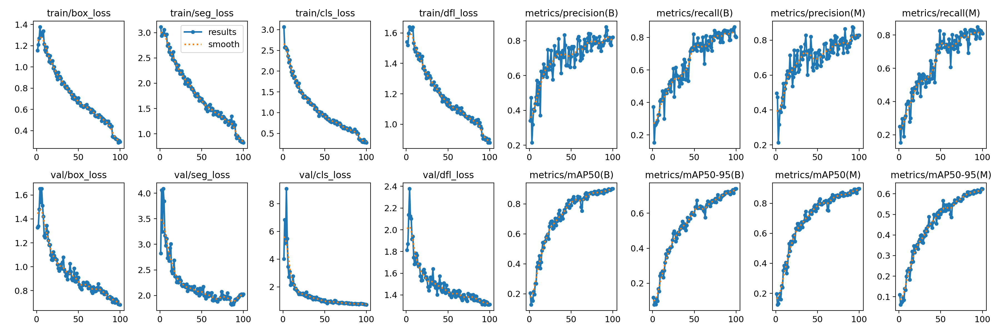

In [53]:
Image("yolov9_dataset/results/100_epochs-2/results.png")

##**Model Inference**

In [54]:
inference_model = YOLO(' yolov9_dataset/results/100_epochs-2/weights/best.pt')


image 1/1 /content/gdrive/MyDrive/yolov9/yolov9_dataset/test/images/000018.jpg: 640x512 1 trousers, 1 trousers, 295.7ms
Speed: 9.6ms preprocess, 295.7ms inference, 10.8ms postprocess per image at shape (1, 3, 640, 512)
Results saved to runs/segment/predict


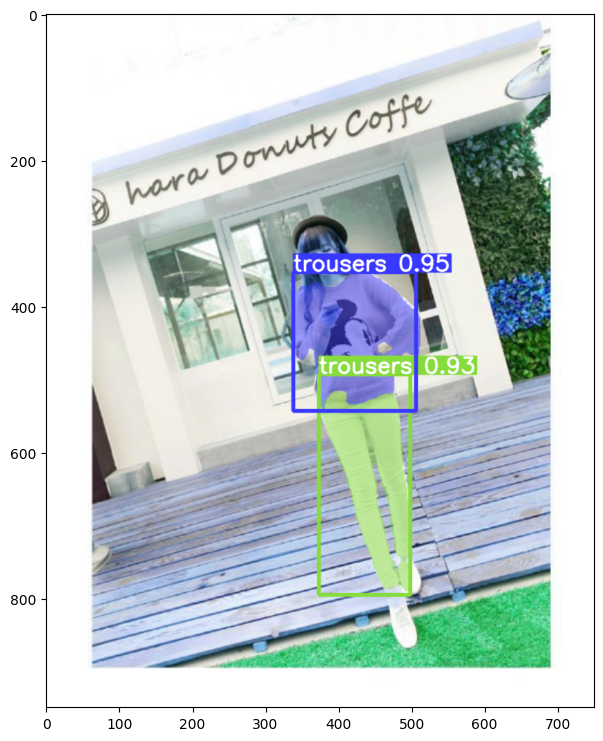

In [55]:
%matplotlib inline
inference_img_path = "/content/gdrive/MyDrive/yolov9/yolov9_dataset/test/images/000018.jpg"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /content/gdrive/MyDrive/yolov9/yolov9_dataset/test/images/000038.jpg: 640x448 1 shorts, 222.9ms
Speed: 3.3ms preprocess, 222.9ms inference, 5.1ms postprocess per image at shape (1, 3, 640, 448)
Results saved to runs/segment/predict


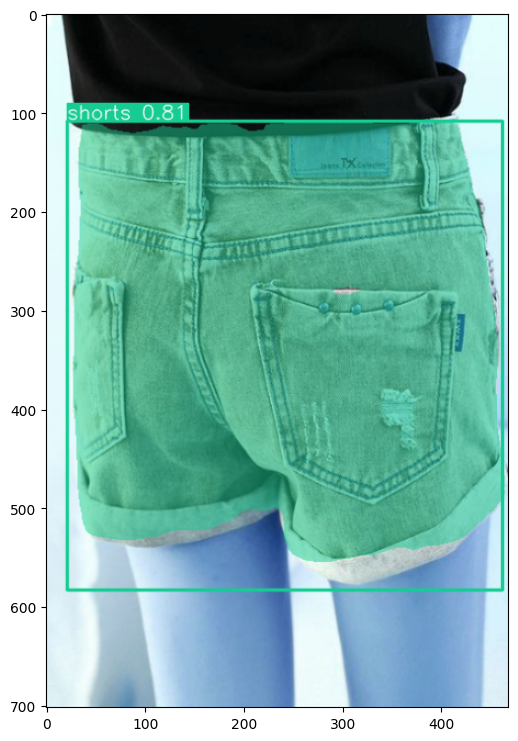

In [56]:
%matplotlib inline
inference_img_path = "/content/gdrive/MyDrive/yolov9/yolov9_dataset/test/images/000038.jpg"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /content/gdrive/MyDrive/yolov9/yolov9_dataset/train/images/000212.jpg: 640x448 1 trousers, 1 vest dress, 200.0ms
Speed: 14.5ms preprocess, 200.0ms inference, 11.8ms postprocess per image at shape (1, 3, 640, 448)
Results saved to runs/segment/predict


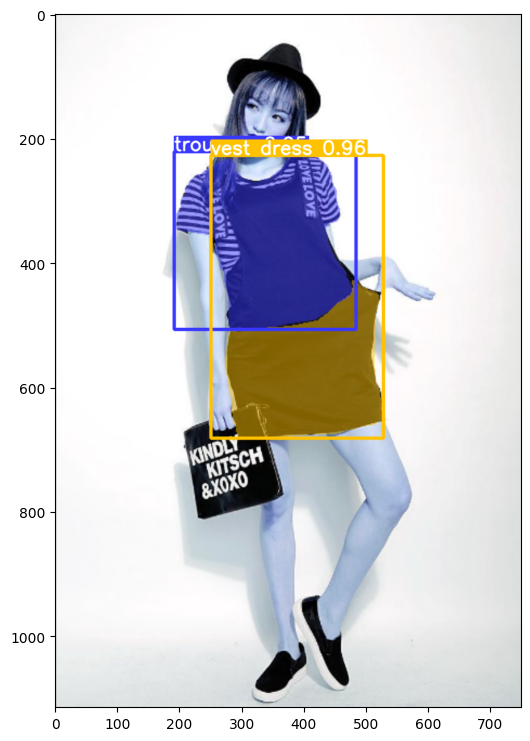

In [67]:
%matplotlib inline
inference_img_path = "/content/gdrive/MyDrive/yolov9/yolov9_dataset/train/images/000212.jpg"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /content/gdrive/MyDrive/yolov9/yolov9_dataset/test/images/000040.jpg: 640x544 1 trousers, 1 shorts, 125.0ms
Speed: 2.5ms preprocess, 125.0ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 544)
Results saved to runs/segment/predict


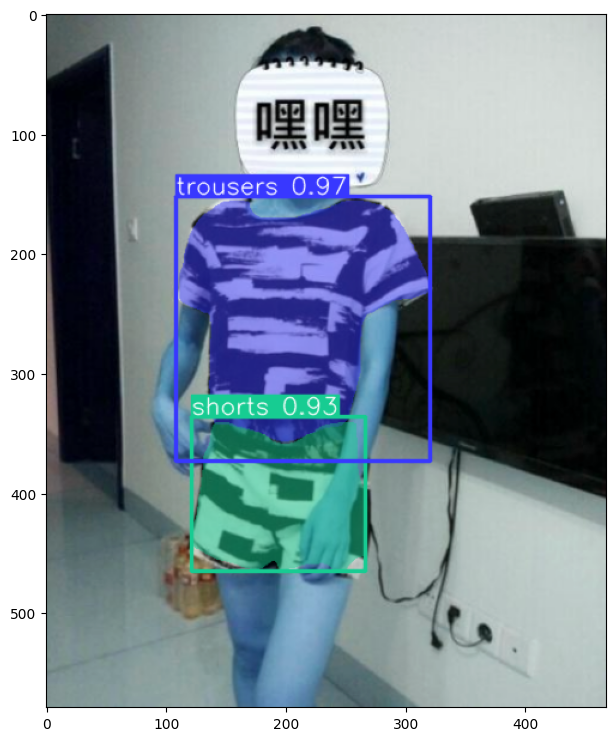

In [58]:
%matplotlib inline
inference_img_path = "/content/gdrive/MyDrive/yolov9/yolov9_dataset/test/images/000040.jpg"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /content/gdrive/MyDrive/yolov9/yolov9_dataset/test/images/000146.jpg: 640x480 1 vest dress, 109.6ms
Speed: 3.0ms preprocess, 109.6ms inference, 5.6ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs/segment/predict


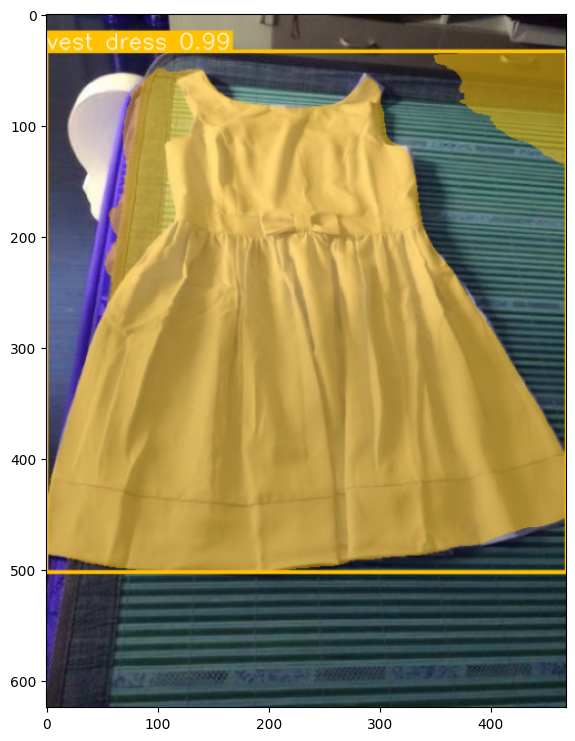

In [60]:
%matplotlib inline
inference_img_path = "/content/gdrive/MyDrive/yolov9/yolov9_dataset/test/images/000146.jpg"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /content/gdrive/MyDrive/yolov9/yolov9_dataset/val/images/000292.jpg: 640x448 1 short sleeve dress, 51.6ms
Speed: 2.5ms preprocess, 51.6ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 448)
Results saved to runs/segment/predict


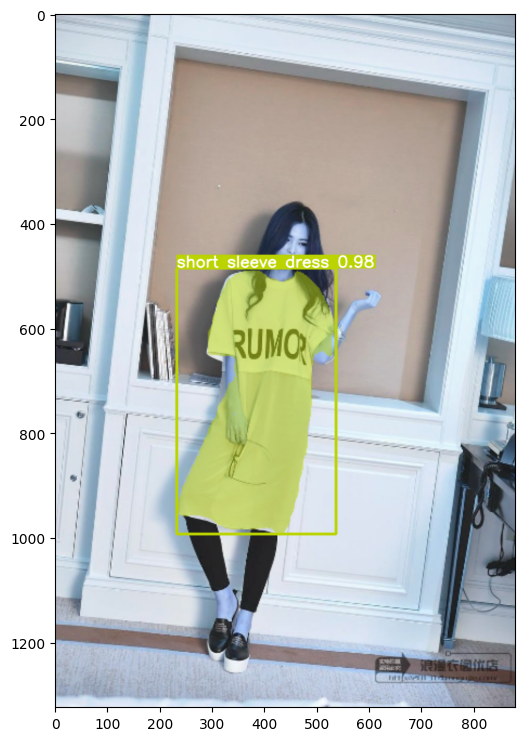

In [65]:
%matplotlib inline
inference_img_path = "/content/gdrive/MyDrive/yolov9/yolov9_dataset/val/images/000292.jpg"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()

In [73]:
metrics = model.val()

Ultralytics YOLOv8.2.8 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c-seg summary (fused): 411 layers, 27634551 parameters, 0 gradients, 157.7 GFLOPs


val: Scanning /content/gdrive/MyDrive/yolov9/yolov9_dataset/val/labels.cache... 100 images, 0 backgrounds, 1 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/gdrive/MyDrive/yolov9/yolov9_dataset/val/images/000250.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0007]



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:12<00:00,  2.06it/s]


                   all         99        162       0.82      0.806      0.901      0.739      0.831      0.814      0.896      0.625
              trousers         99         52      0.978      0.846      0.936      0.784      0.932      0.808      0.901      0.686
       long sleeve top         99         13      0.748      0.923      0.899      0.704      0.748      0.923      0.899       0.56
   long sleeve outwear         99          6      0.697      0.833      0.806      0.512      0.694      0.833      0.806      0.401
                  vest         99          5          1      0.623      0.995      0.734          1      0.627      0.995      0.657
                shorts         99         23      0.905      0.827      0.926       0.76      0.905      0.828       0.91      0.756
              trousers         99         28          1      0.793      0.924      0.788          1      0.794      0.906      0.643
                 skirt         99          9      0.838      0.556   